In [1]:
import openai
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
import re
import time
from openai import OpenAI
import json
import pickle
import pandas as pd
import os

sys.path += ['../src/']
# Set a global seed for reproducibility 
# GLOBAL_SEED = 42
# np.random.seed(GLOBAL_SEED)
# random.seed(GLOBAL_SEED)

#from model import *
import modelWithPersonas as mod
from utils import *

In [2]:
path_exp = '../results/experiments/'

print(f"Current working directory: {os.getcwd()}")
print(f"Path to experiment files: {path_exp}")
print(os.path.abspath("../results/experiments"))

Current working directory: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\notebooks
Path to experiment files: ../results/experiments/
c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments


In [3]:
openai.__version__

'1.50.2'

In [4]:
# set simulation parameters

seed = None
noise_mean = 0
noise_sd = 1/4
temperature = 1
memory = 3
instruction_type = 'original_30-50w'
n_steps = 50
gpt_model="gpt-3.5-turbo-0125"
#gpt_model="gpt-3.5-turbo-1106"

# Positive feedback

## High-Volatility Setup

In [5]:
# High-volatility setup 
n_agents = 4
personas = ["Aggressive Speculator", "Momentum Trader", "Momentum Trader", "Aggressive Speculator"]

In [6]:
expmnt_num = 0
feedback='pos'
expmnt_num = check_existing_file(path_exp, expmnt_num, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)

Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_pos_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv
File expmnt_results_pos_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv already exists.
Changing experiment number to 1, double check this is okay.


In [7]:
#op =original positive
p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=path_exp, personas=personas)

Experiment Fingerprints: e49da607c4f5b2b0d9716ed92e067fc6
 
 Time: 0, agent: 0, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n"reasoning": "As an aggressive speculator, I aim to maximize profit by aggressively following market trends and over-predicting price movements. For the initial prediction, I predict a relatively high price to reflect this strategy.",\n"predictedValue": 70.00\n}'}
 
 Time: 0, agent: 1, persona: Momentum Trader 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": "As the first time step, I will start with a conservative approach aiming to mitigate risk. I predict a mid-range initial price to align with a balanced start.",\n  "predictedValue": 50.00\n}'}
 
 Time: 0, agent: 2, persona: Momentum Trader 

{'role': 'user', 'content': 'This is the first time ste

Text(0.5, 0, 'Time step')

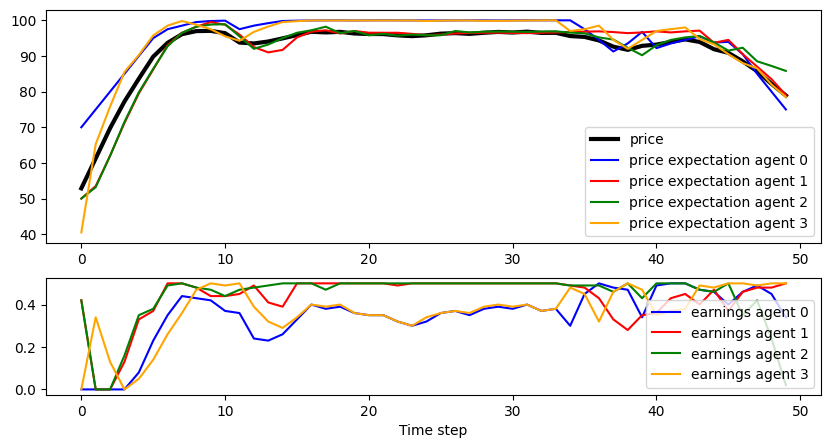

In [8]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), gridspec_kw={'height_ratios': [2, 1]})
colors = ["blue","red","green","orange","violet","cyan","gold"]

axes[0].plot(p_array_op,label="price",color="black",linewidth = 3)
for i in range(n_agents):
    axes[0].plot(pe_agents_time_op[i,:],label="price expectation agent "+str(i),color=colors[i])
    axes[1].plot(rewards_agents_time_op[i,:],label="earnings agent "+str(i),color=colors[i])

#axes[0].set_ylim(0,100)
axes[0].legend()
axes[1].legend()

axes[1].set_xlabel("Time step")
# axes[0].set_xticks(range(n_steps))
# axes[1].set_xticks(range(n_steps))

In [7]:
batch_folder = create_batch_folder("Pos High-Vol Constraint")
for i in range(1, 11):
    expmnt_num = check_existing_file(path_exp, i, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)
    print(f"Running experiment {i} for High-volatility Setup...")

    p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=batch_folder, personas=personas)

Created batch experiment folder: ../results/experiments/experiment_batch_20250308_153210_Pos_High-Vol_Constraint
Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_pos_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv
File expmnt_results_pos_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 1.
Running experiment 1 for High-volatility Setup...
Experiment Fingerprints: e49da607c4f5b2b0d9716ed92e067fc6
 
 Time: 0, agent: 0, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": "I will make an aggressive prediction at the upper end of the possible rang

## Realistic, Diverse market Scenario

In [8]:
n_agents = 6
personas = ["Aggressive Speculator", "Momentum Investor", "Balanced-Decision Maker", "Market Analyst", "Contrarian Investor", "Fundamentalist Trader"]

In [9]:
expmnt_num = 0
feedback='pos'
expmnt_num = check_existing_file(path_exp, expmnt_num, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)

Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_pos_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_6_model_gpt-3-5-turbo-0125.csv
File expmnt_results_pos_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_6_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 0.


In [10]:
p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=path_exp, personas=personas)

Experiment Fingerprints: 45a66fe60bf989a7b9338ea978894815
 
 Time: 0, agent: 0, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n    "reasoning": "Aggressive strategy focused on maximizing profit through bold predictions by following market trends aggressively.",\n    "predictedValue": 60.00\n}'}
 
 Time: 0, agent: 1, persona: Momentum Investor 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": "The initial price prediction is based on an assumption of a stable market with no historical data to rely on. Therefore, I will predict a neutral initial price of 50 euros.",\n  "predictedValue": 50\n}'}
 
 Time: 0, agent: 2, persona: Balanced-Decision Maker 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n

Text(0.5, 0, 'Time step')

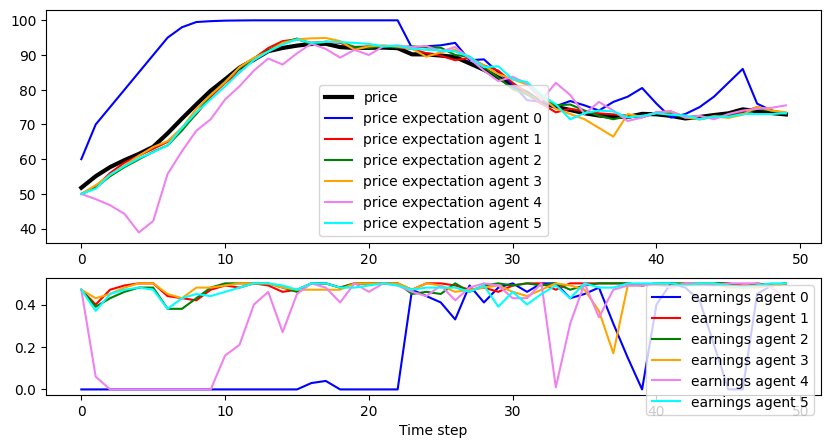

In [12]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), gridspec_kw={'height_ratios': [2, 1]})
colors = ["blue","red","green","orange","violet","cyan","gold"]

axes[0].plot(p_array_op,label="price",color="black",linewidth = 3)
for i in range(n_agents):
    axes[0].plot(pe_agents_time_op[i,:],label="price expectation agent "+str(i),color=colors[i])
    axes[1].plot(rewards_agents_time_op[i,:],label="earnings agent "+str(i),color=colors[i])

#axes[0].set_ylim(0,100)
axes[0].legend()
axes[1].legend()

axes[1].set_xlabel("Time step")
# axes[0].set_xticks(range(n_steps))
# axes[1].set_xticks(range(n_steps))

In [13]:
batch_folder = create_batch_folder("Pos Realistic Constraint")
for i in range(1, 11):
    expmnt_num = check_existing_file(path_exp, i, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)
    print(f"Running experiment {i} for Realistic, Diverse Setup...")

    p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=batch_folder, personas=personas)

Created batch experiment folder: ../results/experiments/experiment_batch_20250308_161229_Pos_Realistic_Constraint
Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_pos_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_6_model_gpt-3-5-turbo-0125.csv
File expmnt_results_pos_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_6_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 1.
Running experiment 1 for Realistic, Diverse Setup...
Experiment Fingerprints: 45a66fe60bf989a7b9338ea978894815
 
 Time: 0, agent: 0, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": "As an aggressive speculator, I aim to follow market trends aggressivel

## Aggressive Speculators (REDO)

In [6]:
n_agents = 5
personas = ["Aggressive Speculator"] * 5

In [7]:
expmnt_num = 0
feedback='pos'
expmnt_num = check_existing_file(path_exp, expmnt_num, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)

Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_pos_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_5_model_gpt-3-5-turbo-0125.csv
File expmnt_results_pos_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_5_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 0.


In [8]:
p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=path_exp, personas=personas)

Experiment Fingerprints: b6d4122e8155c6a66e45d4f074371de4
 
 Time: 0, agent: 0, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n    "reasoning": "Aggressive speculator strategy, aiming to profit from bold predictions. Expecting potential for strong market trend continuation.",\n    "predictedValue": 50.50\n}'}
 
 Time: 0, agent: 1, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": "As an aggressive speculator, I will boldly predict a strong upward trend to start the market off on a positive note.",\n  "predictedValue": 60.00\n}'}
 
 Time: 0, agent: 2, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": "As an aggressive spe

Text(0.5, 0, 'Time step')

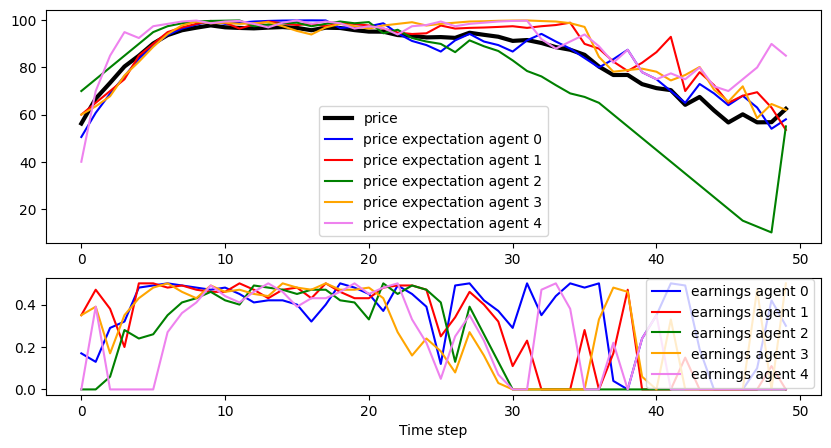

In [9]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), gridspec_kw={'height_ratios': [2, 1]})
colors = ["blue","red","green","orange","violet","cyan","gold"]

axes[0].plot(p_array_op,label="price",color="black",linewidth = 3)
for i in range(n_agents):
    axes[0].plot(pe_agents_time_op[i,:],label="price expectation agent "+str(i),color=colors[i])
    axes[1].plot(rewards_agents_time_op[i,:],label="earnings agent "+str(i),color=colors[i])

#axes[0].set_ylim(0,100)
axes[0].legend()
axes[1].legend()

axes[1].set_xlabel("Time step")
# axes[0].set_xticks(range(n_steps))
# axes[1].set_xticks(range(n_steps))

In [11]:
batch_folder = create_batch_folder("Pos Aggr Speculator Constraint")
for i in range(1, 11):
    expmnt_num = check_existing_file(path_exp, i, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)
    print(f"Running experiment {i} for Aggressive Speculator Setup...")

    p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=batch_folder, personas=personas)

Created batch experiment folder: ../results/experiments/experiment_batch_20250316_175510_Pos_Aggr_Speculator_Constraint
Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_pos_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_5_model_gpt-3-5-turbo-0125.csv
File expmnt_results_pos_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_5_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 1.
Running experiment 1 for Aggressive Speculator Setup...
Experiment Fingerprints: b6d4122e8155c6a66e45d4f074371de4
 
 Time: 0, agent: 0, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n    "reasoning": "Expecting an aggressive market trend continuation, I predic

FileNotFoundError: [Errno 2] No such file or directory: 'c:\\Users\\Sidney\\Documents\\Year 3\\Final Year Project\\gpt_agents-master\\results\\experiments\\experiment_batch_20250316_175510_Pos_Aggr_Speculator_Constraint\\expmnt_messages_pos_original_30-50w_num_10_temp_1_memory_3_ntime_50_nagents_5_model_gpt-3-5-turbo-0125.pkl'

# Negative feedback

In [1]:
import openai
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
import re
import time
from openai import OpenAI
import json
import pickle
import pandas as pd
import os

sys.path += ['../src/']
# Set a global seed for reproducibility 
# GLOBAL_SEED = 42
# np.random.seed(GLOBAL_SEED)
# random.seed(GLOBAL_SEED)

#from model import *
import modelWithPersonas as mod
from utils import *

In [2]:
path_exp = '../results/experiments/'

print(f"Current working directory: {os.getcwd()}")
print(f"Path to experiment files: {path_exp}")
print(os.path.abspath("../results/experiments"))

Current working directory: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\notebooks
Path to experiment files: ../results/experiments/
c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments


In [3]:
# set simulation parameters

seed = None
noise_mean = 0
noise_sd = 1/4
temperature = 1
memory = 3
instruction_type = 'original_30-50w'
n_steps = 50
gpt_model="gpt-3.5-turbo-0125"
#gpt_model="gpt-3.5-turbo-1106"

## High Volatility Setup

In [4]:
# High-volatility setup
n_agents = 4 
personas = ["Aggressive Speculator", "Momentum Trader", "Momentum Trader", "Aggressive Speculator"]

In [5]:
expmnt_num = 0
feedback = 'neg'
expmnt_num = check_existing_file(path_exp, expmnt_num, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)

Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_neg_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv
File expmnt_results_neg_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 0.


In [6]:
p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=path_exp, personas=personas)

Experiment Fingerprints: 2811374ef847cad37fb0a0204e46f2b9
 
 Time: 0, agent: 0, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n"reasoning": "Aggressive speculator seeking to maximize profit through bold predictions by aggressively following market trends.",\n"predictedValue": 50.00\n}'}
 
 Time: 0, agent: 1, persona: Momentum Trader 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n    "reasoning": "Initial prediction based on averaging historical prices and considering moderate momentum.",\n    "predictedValue": 50.00\n}'}
 
 Time: 0, agent: 2, persona: Momentum Trader 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n"reasoning": "Initiating prediction by considering initial market trends and momentum.",\n"pr

Text(0.5, 0, 'Time step')

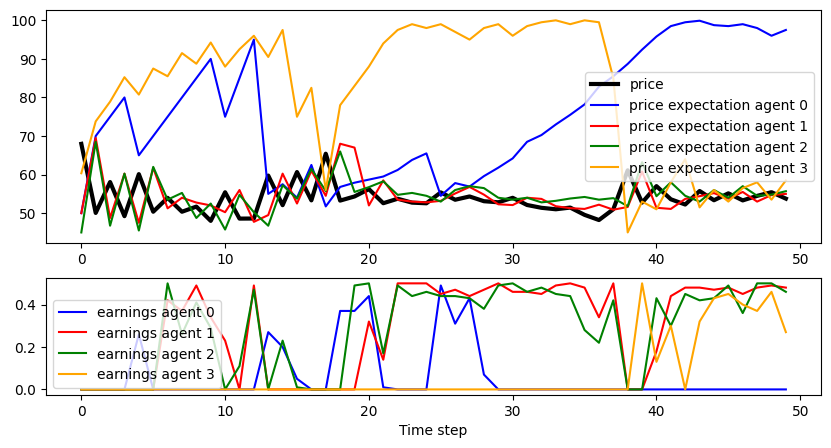

In [7]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), gridspec_kw={'height_ratios': [2, 1]})
colors = ["blue","red","green","orange","violet","cyan","gold"]

axes[0].plot(p_array_op,label="price",color="black",linewidth = 3)
for i in range(n_agents):
    axes[0].plot(pe_agents_time_op[i,:],label="price expectation agent "+str(i),color=colors[i])
    axes[1].plot(rewards_agents_time_op[i,:],label="earnings agent "+str(i),color=colors[i])

#axes[0].set_ylim(0,100)
axes[0].legend()
axes[1].legend()

axes[1].set_xlabel("Time step")
# axes[0].set_xticks(range(n_steps))
# axes[1].set_xticks(range(n_steps))

In [8]:
batch_folder = create_batch_folder("Neg High-Volatility Constraint")
for i in range(1, 11):
    expmnt_num = check_existing_file(path_exp, i, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)
    print(f"Running experiment {i} for High-volatility Setup...")
    
    p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
            expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
            feedback=feedback, instruction_type=instruction_type, prints_on=True,\
            save_res_bool=True, path_exp=batch_folder, personas=personas)

Created batch experiment folder: ../results/experiments/experiment_batch_20250308_201223_Neg_High-Volatility_Constraint
Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_neg_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv
File expmnt_results_neg_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 1.
Running experiment 1 for High-volatility Setup...
Experiment Fingerprints: 2811374ef847cad37fb0a0204e46f2b9
 
 Time: 0, agent: 0, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n    "reasoning": "Aggressive speculator strategy aiming to capitalize on bold price

FileNotFoundError: [Errno 2] No such file or directory: 'c:\\Users\\Sidney\\Documents\\Year 3\\Final Year Project\\gpt_agents-master\\results\\experiments\\experiment_batch_20250308_201223_Neg_High-Volatility_Constraint\\expmnt_messages_neg_original_30-50w_num_10_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.pkl'

## Stability-Focused Setup

In [9]:
n_agents = 4
personas = ["Contrarian Investor", "Fundamentalist Trader", "Fundamentalist Trader", "Contrarian Investor"]

In [10]:
expmnt_num = 0
feedback='neg'
expmnt_num = check_existing_file(path_exp, expmnt_num, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)

Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_neg_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv
File expmnt_results_neg_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 0.


In [11]:
p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=path_exp, personas=personas)

Experiment Fingerprints: 2811374ef847cad37fb0a0204e46f2b9
 
 Time: 0, agent: 0, persona: Contrarian Investor 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n\t"reasoning": "Initial predictions are made considering market equilibrium and a neutral stance towards market trends.",\n\t"predictedValue": 50.00\n}'}
 
 Time: 0, agent: 1, persona: Fundamentalist Trader 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": "Initial prediction based on market stability and long-term averages.",\n  "predictedValue": 50\n}'}
 
 Time: 0, agent: 2, persona: Fundamentalist Trader 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n    "reasoning": "Initial prediction based on market stability and historical averages.",\n    "predictedValue": 50.00\

Text(0.5, 0, 'Time step')

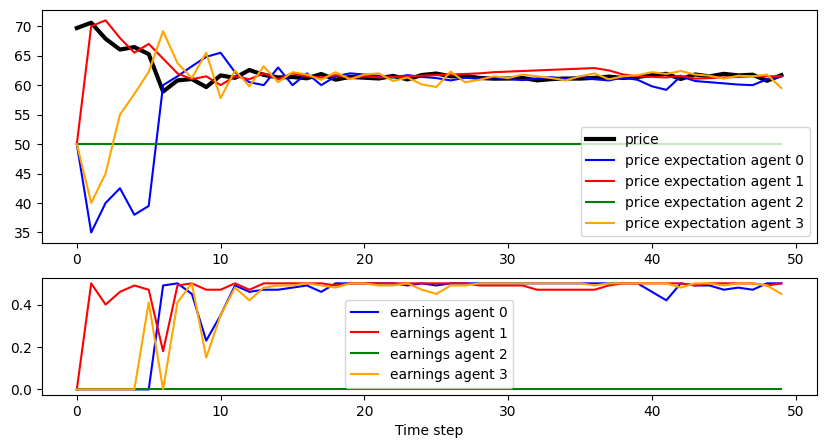

In [12]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), gridspec_kw={'height_ratios': [2, 1]})
colors = ["blue","red","green","orange","violet","cyan","gold"]

axes[0].plot(p_array_op,label="price",color="black",linewidth = 3)
for i in range(n_agents):
    axes[0].plot(pe_agents_time_op[i,:],label="price expectation agent "+str(i),color=colors[i])
    axes[1].plot(rewards_agents_time_op[i,:],label="earnings agent "+str(i),color=colors[i])

#axes[0].set_ylim(0,100)
axes[0].legend()
axes[1].legend()

axes[1].set_xlabel("Time step")
# axes[0].set_xticks(range(n_steps))
# axes[1].set_xticks(range(n_steps))

In [ ]:
batch_folder = create_batch_folder("Neg Stability-Focused")
for i in range(1, 11):
    expmnt_num = check_existing_file(path_exp, i, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)
    print(f"Running experiment {i} for Stability-Focused Setup...")

    p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=batch_folder, personas=personas)

Created batch experiment folder: ../results/experiments/experiment_batch_20250308_205627_Stability-Focused_Negative
Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_neg_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv
File expmnt_results_neg_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_4_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 1.
Running experiment 1 for Stability-Focused Setup...
Experiment Fingerprints: 2811374ef847cad37fb0a0204e46f2b9
 
 Time: 0, agent: 0, persona: Contrarian Investor 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": "Initial prediction based on expected contrarian market behavior.",\n  "

## Realistic, Diverse market Scenario

In [14]:
n_agents = 6
personas = ["Aggressive Speculator", "Momentum Investor", "Balanced-Decision Maker", "Market Analyst", "Contrarian Investor", "Fundamentalist Trader"]

In [15]:
expmnt_num = 0
feedback='neg'
expmnt_num = check_existing_file(path_exp, expmnt_num, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)

Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_neg_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_6_model_gpt-3-5-turbo-0125.csv
File expmnt_results_neg_original_30-50w_num_0_temp_1_memory_3_ntime_50_nagents_6_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 0.


In [16]:
p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=path_exp, personas=personas)

Experiment Fingerprints: 12d2732077325495a5f12cd1e13c7b59
 
 Time: 0, agent: 0, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": "Aggressive speculation strategy, expecting trends to continue for longer. Thus, predicting significant increase from initial price of 50 euros.",\n  "predictedValue": 65.00\n}'}
 
 Time: 0, agent: 1, persona: Momentum Investor 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n"reasoning": "I will start with a conservative estimate, considering equilibrium and the initial state, expecting a stable market at the beginning.",\n"predictedValue": 50.00\n}'}
 
 Time: 0, agent: 2, persona: Balanced-Decision Maker 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": 

Text(0.5, 0, 'Time step')

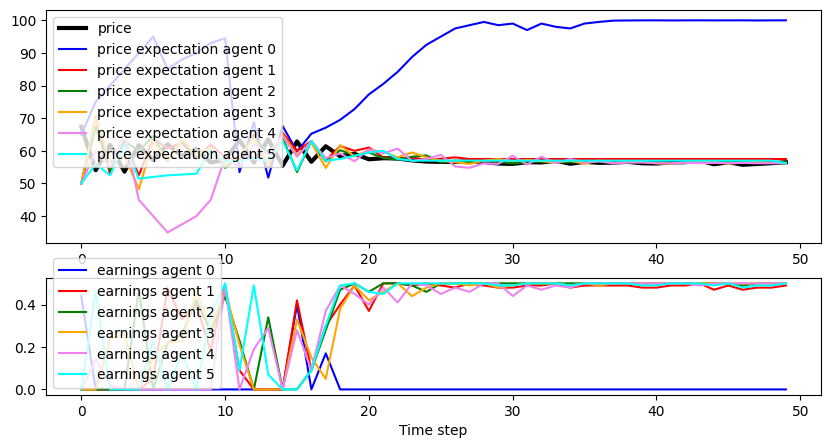

In [17]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 5), gridspec_kw={'height_ratios': [2, 1]})
colors = ["blue","red","green","orange","violet","cyan","gold"]

axes[0].plot(p_array_op,label="price",color="black",linewidth = 3)
for i in range(n_agents):
    axes[0].plot(pe_agents_time_op[i,:],label="price expectation agent "+str(i),color=colors[i])
    axes[1].plot(rewards_agents_time_op[i,:],label="earnings agent "+str(i),color=colors[i])

#axes[0].set_ylim(0,100)
axes[0].legend()
axes[1].legend()

axes[1].set_xlabel("Time step")
# axes[0].set_xticks(range(n_steps))
# axes[1].set_xticks(range(n_steps))

In [19]:
batch_folder = create_batch_folder("Neg Realistic Constraint")
for i in range(1, 11):
    expmnt_num = check_existing_file(path_exp, i, feedback, instruction_type, temperature, memory, n_steps, n_agents, gpt_model)
    print(f"Running experiment {i} for Realistic, Diverse Setup...")

    p_array_op, pe_agents_time_op, rewards_agents_time_op, messages_list_op  = mod.run_experiment(seed,\
                expmnt_num, noise_mean, noise_sd, temperature, memory=memory, gpt_model=gpt_model, n_steps=n_steps, n_agents=n_agents,
                feedback=feedback, instruction_type=instruction_type, prints_on=True,\
                save_res_bool=True, path_exp=batch_folder, personas=personas)

Created batch experiment folder: ../results/experiments/experiment_batch_20250308_213719_Neg_Realistic_Constraint
Checking files in absolute path: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments
Looking for file: c:\Users\Sidney\Documents\Year 3\Final Year Project\gpt_agents-master\results\experiments\expmnt_results_neg_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_6_model_gpt-3-5-turbo-0125.csv
File expmnt_results_neg_original_30-50w_num_1_temp_1_memory_3_ntime_50_nagents_6_model_gpt-3-5-turbo-0125.csv does not exist. Safe to proceed with experiment number 1.
Running experiment 1 for Realistic, Diverse Setup...
Experiment Fingerprints: 12d2732077325495a5f12cd1e13c7b59
 
 Time: 0, agent: 0, persona: Aggressive Speculator 

{'role': 'user', 'content': 'This is the first time step, give an initial price prediction'}
{'role': 'assistant', 'content': '{\n  "reasoning": "Aggressive speculator strategy: Expecting price trends to be followed 